In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cc_client_csv = 'https://s3-student-datasets-bucket.whjr.online/whitehat-ds-datasets/uci-credit-card-fraud/UCI_Credit_Card.csv'
df = pd.read_csv(cc_client_csv)

df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [ ]:
df.rename(columns = {"PAY_0": "PAY_1"}, inplace = True)
df.rename(columns = {"default.payment.next.month": "DEFAULT"}, inplace = True)

for i in range(df.shape[1]):
  print(f"At index {i:02}, {df.columns[i]}")

At index 00, ID
At index 01, LIMIT_BAL
At index 02, SEX
At index 03, EDUCATION
At index 04, MARRIAGE
At index 05, AGE
At index 06, PAY_1
At index 07, PAY_2
At index 08, PAY_3
At index 09, PAY_4
At index 10, PAY_5
At index 11, PAY_6
At index 12, BILL_AMT1
At index 13, BILL_AMT2
At index 14, BILL_AMT3
At index 15, BILL_AMT4
At index 16, BILL_AMT5
At index 17, BILL_AMT6
At index 18, PAY_AMT1
At index 19, PAY_AMT2
At index 20, PAY_AMT3
At index 21, PAY_AMT4
At index 22, PAY_AMT5
At index 23, PAY_AMT6
At index 24, DEFAULT


In [ ]:
df['EDUCATION'].value_counts()

2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: EDUCATION, dtype: int64

In [ ]:
df.loc[df['EDUCATION'] == 0, 'EDUCATION'] = 5
df.loc[df['EDUCATION'] == 6, 'EDUCATION'] = 5

df['EDUCATION'].value_counts()

2    14030
1    10585
3     4917
5      345
4      123
Name: EDUCATION, dtype: int64

In [ ]:
grp_gender_df = df[['ID', 'MARRIAGE', 'DEFAULT']].groupby(by = ['DEFAULT', 'MARRIAGE']).count()
grp_gender_df

ID
DEFAULT MARRIAGE       
0       0            49
        1         10453
        2         12623
        3           239
1       0             5
        1          3206
        2          3341
        3            84

In [ ]:
df.loc[df['MARRIAGE'] == 0, 'MARRIAGE'] = 3
df['MARRIAGE'].value_counts()

2    15964
1    13659
3      377
Name: MARRIAGE, dtype: int64

In [ ]:
grp_marriage_df = df[['ID', 'MARRIAGE', 'DEFAULT']].groupby(by = ['DEFAULT', 'MARRIAGE']).count()
print("The number of credit card clients having different education qualification out of all the defaulters.")
print(grp_marriage_df, "\n" + "-" * 100)

grp_age_df = df[['AGE', 'DEFAULT']].groupby(by = 'DEFAULT').agg(func = ['mean', 'std', 'median'])
print("The mean and median age of defaulters and non-defaulters.")
print(grp_age_df, "\n" + "-" * 100)

grp_limit_bal_df = df[['LIMIT_BAL', 'DEFAULT']].groupby(by = 'DEFAULT').agg(func = ['mean', 'std', 'median'])
print("The mean and median 'LIMIT_BAL' of defaulters and non-defaulters.")
print(grp_limit_bal_df, "\n" + "-" * 100)

The number of credit card clients having different education qualification out of all the defaulters.
                     ID
DEFAULT MARRIAGE       
0       1         10453
        2         12623
        3           288
1       1          3206
        2          3341
        3            89 
----------------------------------------------------------------------------------------------------
The mean and median age of defaulters and non-defaulters.
               AGE                 
              mean       std median
DEFAULT                            
0        35.417266  9.077355   34.0
1        35.725738  9.693438   34.0 
----------------------------------------------------------------------------------------------------
The mean and median 'LIMIT_BAL' of defaulters and non-defaulters.
             LIMIT_BAL                         
                  mean            std    median
DEFAULT                                        
0        178099.726074  131628.359660  150000.0
1     

In [ ]:
df[['LIMIT_BAL', 'AGE'] + list(df.columns[12:-1])].describe()

,LIMIT_BAL,AGE,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
count,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000
mean,167484.322667,35.485500,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567
std,129747.661567,9.217904,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775
min,10000.000000,21.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000
25%,50000.000000,28.000000,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000
50%,140000.000000,34.000000,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000
75%,240000.000000,41.000000,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000
max,1000000.000000,79.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000


In [ ]:
pivot_table2 = pd.pivot_table(data = df, values = ['LIMIT_BAL', 'AGE'] + list(df.columns[12:-1]), index = ['DEFAULT', 'MARRIAGE'], aggfunc = 'median')
pivot_table2

AGE  BILL_AMT1  BILL_AMT2  BILL_AMT3  BILL_AMT4  BILL_AMT5  \
DEFAULT MARRIAGE                                                               
0       1          39    22573.0    21022.0    19905.0    18532.0    17390.0   
        2          30    23469.0    22382.0    20401.0    19353.0    18336.0   
        3          42    21953.5    20432.0    18411.0    17915.5    16784.0   
1       1          40    21633.5    21190.5    20445.0    19588.0    19001.5   
        2          29    19438.0    19844.0    19492.0    18859.0    18187.0   
        3          44    18126.0    18459.0    18942.0    18300.0    17760.0   

                  BILL_AMT6  LIMIT_BAL  PAY_AMT1  PAY_AMT2  PAY_AMT3  \
DEFAULT MARRIAGE                                                       
0       1           15442.0   180000.0    2500.0    2386.0    2000.0   
        2           17345.0   140000.0    2406.0    2200.0    2000.0   
        3           14691.0    70000.0    1943.0    1678.5    1477.5   
1       1           18320.5   100000.0    1616.5    1600.0    1238.0   
        2           17976.0    80000.0    1640.0    1500.0    1214.0   
        3           17327.0    50000.0    1700.0    1679.0    1000.0   

                  PAY_AMT4  PAY_AMT5  PAY_AMT6  
DEFAULT MARRIAGE                                
0       1           1877.0    1876.0    1800.0  
        2           1680.0    1707.0    1681.0  
        3           1062.5    1000.0    1000.0  
1       1           1000.0    1000.0    1000.0  
        2           1000.0    1000.0    1000.0  
        3           1000.0    1000.0     800.0

In [ ]:
pivot_table3 = pd.pivot_table(data = df, values = ['LIMIT_BAL', 'AGE'] + list(df.columns[12:-1]), index = ['DEFAULT', 'EDUCATION'], aggfunc = 'median')
pivot_table3

AGE  BILL_AMT1  BILL_AMT2  BILL_AMT3  BILL_AMT4  BILL_AMT5  \
DEFAULT EDUCATION                                                               
0       1           32    14712.0    14244.0    14394.0    13222.0    11599.0   
        2           34    28084.5    27057.0    24908.5    21228.5    19683.0   
        3           40    27220.5    25402.5    22889.0    19559.5    18610.0   
        4           32    10734.5     8872.5     7183.0    10412.5     6342.0   
        5           35    42407.0    36011.0    31500.0    27981.0    21617.0   
1       1           33    10797.5    11730.5    11391.0    10819.5    10466.5   
        2           33    25344.0    24653.0    23086.0    20423.0    19688.5   
        3           41    21508.0    21410.0    20453.0    19584.0    18362.0   
        4           29     5374.0    12360.0    20721.0     1000.0      326.0   
        5           41    73699.5    67973.5    60048.5    45139.0    27405.5   

                   BILL_AMT6  LIMIT_BAL  PAY_AMT1  PAY_AMT2  PAY_AMT3  \
DEFAULT EDUCATION                                                       
0       1            10075.0   200000.0    2991.0    2800.0    2101.0   
        2            19204.0   130000.0    2252.0    2100.0    2000.0   
        3            17912.0   100000.0    2069.5    2000.0    1726.0   
        4             5334.0   200000.0    3000.0    3000.0    2950.0   
        5            12106.0   160000.0    3000.0    3078.0    2524.0   
1       1             9667.0   150000.0    1500.0    1468.5    1025.5   
        2            19414.5    80000.0    1700.0    1600.0    1300.0   
        3            17636.0    50000.0    1600.0    1585.0    1200.0   
        4              390.0   120000.0    5000.0    2000.0    1000.0   
        5            25796.0   110000.0    3500.0    2690.5    1418.0   

                   PAY_AMT4  PAY_AMT5  PAY_AMT6  
DEFAULT EDUCATION                                
0       1            2000.0    2000.0    2000.0  
        2            1700.0    1700.0    1600.0  
        3            1396.5    1446.0    1304.0  
        4            1908.5    1399.5    1786.0  
        5            1842.0    1500.0    1610.0  
1       1             929.5    1000.0     902.0  
        2            1000.0    1009.5    1000.0  
        3            1000.0    1000.0    1000.0  
        4             326.0     390.0     780.0  
        5            1868.5    1295.5    1167.5

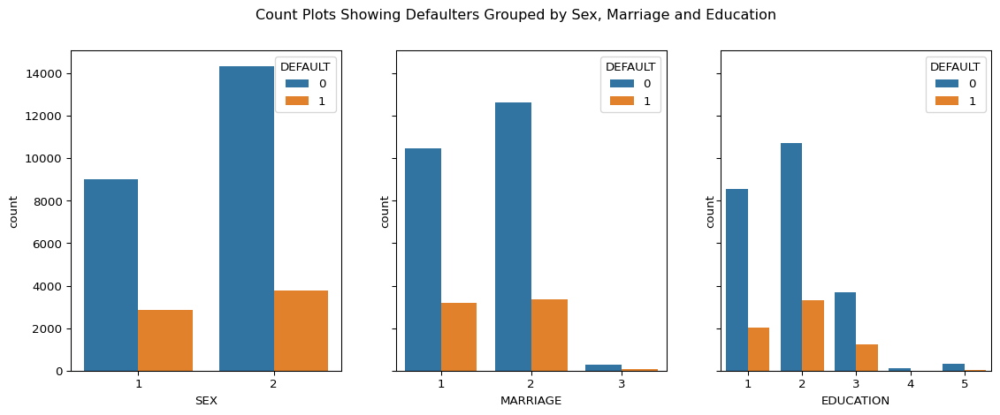

In [ ]:
fig1, axis1 = plt.subplots(nrows = 1, ncols = 3, figsize = (14, 5), dpi = 96, sharey = True)
sns.countplot(x = 'SEX', data = df, hue = 'DEFAULT', ax = axis1[0])
sns.countplot(x = 'MARRIAGE', data = df, hue = 'DEFAULT', ax = axis1[1])
sns.countplot(x = 'EDUCATION', data = df, hue = 'DEFAULT', ax = axis1[2])
fig1.suptitle('Count Plots Showing Defaulters Grouped by Sex, Marriage and Education')
plt.show()

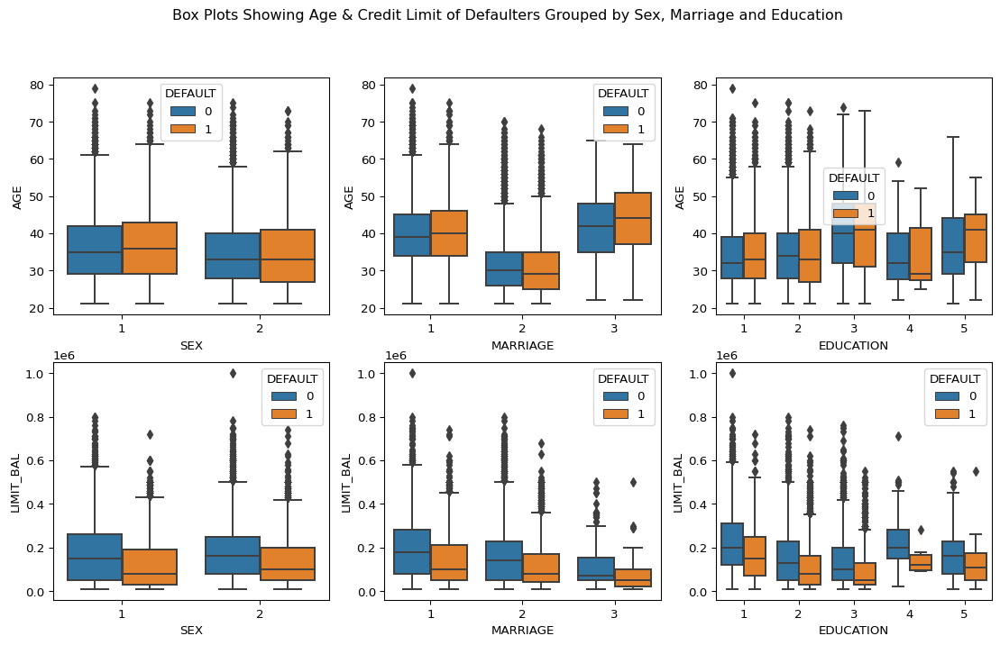

In [ ]:
fig2, axis2 = plt.subplots(nrows = 2, ncols = 3, figsize = (14, 8), dpi = 96, sharey = False)
sns.boxplot(x = 'SEX', y = 'AGE', hue = 'DEFAULT', data = df, ax = axis2[0, 0])
sns.boxplot(x = 'MARRIAGE', y = 'AGE', hue = 'DEFAULT', data = df, ax = axis2[0, 1])
sns.boxplot(x = 'EDUCATION', y = 'AGE', hue = 'DEFAULT', data = df, ax = axis2[0, 2])
sns.boxplot(x = 'SEX', y = 'LIMIT_BAL', hue = 'DEFAULT', data = df, ax = axis2[1, 0])
sns.boxplot(x = 'MARRIAGE', y = 'LIMIT_BAL', hue = 'DEFAULT', data = df, ax = axis2[1, 1])
sns.boxplot(x = 'EDUCATION', y = 'LIMIT_BAL', hue = 'DEFAULT', data = df, ax = axis2[1, 2])
fig2.suptitle('Box Plots Showing Age & Credit Limit of Defaulters Grouped by Sex, Marriage and Education')
plt.show()

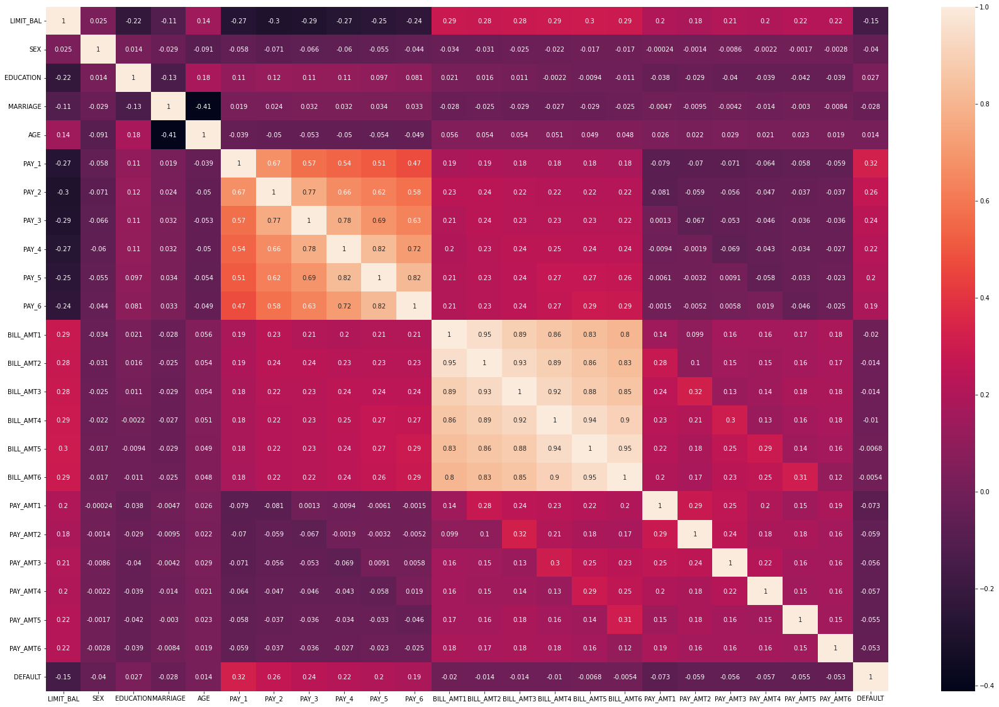

In [ ]:
plt.figure(figsize = (30,20))
sns.heatmap(df.iloc[:,1:].corr(),annot=True)
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn import metrics
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report

fcols = list(df.columns)
fcols.remove('DEFAULT')
fcols.remove('ID')
x = df[fcols]
y = df['DEFAULT']
x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.33, random_state= 42)
dtc = DecisionTreeClassifier(random_state = 42)
dtc.fit(x_train,y_train)
train_pred = dtc.predict(x_train)
test_pred = dtc.predict(x_test)
print(metrics.accuracy_score(y_train,train_pred))
print(metrics.accuracy_score(y_test,test_pred))


0.9995024875621891
0.7251515151515151


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     15622
           1       1.00      1.00      1.00      4478

    accuracy                           1.00     20100
   macro avg       1.00      1.00      1.00     20100
weighted avg       1.00      1.00      1.00     20100



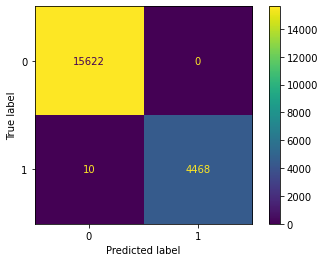

In [ ]:
plot_confusion_matrix(dtc, x_train, y_train, values_format ='d')
print(classification_report(y_train,train_pred))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


              precision    recall  f1-score   support

           0       0.83      0.81      0.82      7742
           1       0.38      0.42      0.40      2158

    accuracy                           0.73      9900
   macro avg       0.61      0.61      0.61      9900
weighted avg       0.73      0.73      0.73      9900



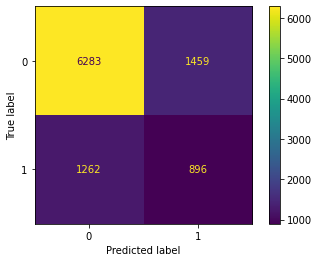

In [ ]:
plot_confusion_matrix(dtc, x_test, y_test, values_format ='d')
print(classification_report(y_test,test_pred))

In [ ]:
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image
import pydotplus

dot_data = StringIO()
export_graphviz(decision_tree = dtc,out_file= dot_data, filled = True, feature_names = fcols, class_names = ['0','1'])
g = pydotplus.graph_from_dot_data(dot_data.getvalue())
g.write_png('CCT.png')
Image(g.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.24591 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.24591 to fit



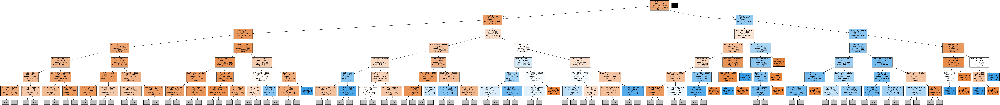

In [ ]:
# S3.2: Resize the above decision tree using the 'max_depth' parameter.
dot_data = StringIO()
export_graphviz(decision_tree = dtc,out_file= dot_data, filled = True, feature_names = fcols, class_names = ['0','1'], max_depth=6)
g = pydotplus.graph_from_dot_data(dot_data.getvalue())
g.write_png('CCT.png')
Image(g.create_png())

#### Determining a Root Node

There are 2 features (Education and Gender) in the above table. This implies that we have two candidates for root nodes: (a) Gender (b) Education


**Splitting Root Node wrt Gender**

Let us first calculate the gini index for the **Gender** column.

There are 2 instances of `Female` value in the **Gender** column: one of them is a `defaulter` (represented by `Yes` or `1`) and another is a `non-defaulter` (represented by
`No` or `0`)

- So, the probability of a `Female` credit card client being a `defaulter` is $p_1 = \frac{1}{2}$

- Similarly, the probability of a `Female` credit card client being a `non-defaulter` is $p_2 = \frac{1}{2}$

Let the gini index of the `Female` value be $f$.

Therefore, the gini index of $f$ is given by

$$f = 1 - \sum_{i = 1}^{N} (p_{i})^2$$

Here, $N = 2$ because there are only two probabilities, i.e., $p_1$ and $p_2$. So, the value of $i$ also goes from $1$ to $2$.

\begin{align}
\therefore f &= 1 - \sum_{i = 1}^{N} (p_{i})^2 \\
&= 1 - ( p_1^2 + p_2^2 )
\end{align}

On substituting the values of $p_1 = \frac{1}{2}$ and $p_2 = \frac{1}{2}$ in the above equation, we get

\begin{align}
&= 1 - \left( \left(\frac{1}{2}\right)^2 + \left(\frac{1}{2}\right)^2 \right) \\
&= 1 - \frac{1}{2} \\
\Rightarrow f &= 0.5
\end{align}

Similarly, there are 3 instances of `Male` value in the **Gender** column: one of them is a `defaulter` (represented by `Yes` or `1`) and two of them are `non-defaulter` (represented by
`No` or `0`)

- So, the probability of a `Male` credit card client being a `defaulter` is $p_1 = \frac{1}{3}$

- Similarly, the probability of a `Male` credit card client being a `non-defaulter` is $p_2 = \frac{2}{3}$

Let the gini index of the `Male` value be $m$.

Therefore, the gini index of $m$ is given by

$$m = 1 - \sum_{i = 1}^{N} (p_{i})^2$$

Here, $N = 2$ because there are only two probabilities, i.e., $p_1$ and $p_2$. So, the value of $i$ also goes from $1$ to $2$.

\begin{align}
\therefore m &= 1 - \sum_{i = 1}^{N} (p_{i})^2 \\
&= 1 - ( p_1^2 + p_2^2 )
\end{align}

On substituting the values of $p_1 = \frac{1}{3}$ and $p_2 = \frac{2}{3}$ in the above equation, we get

\begin{align}
&= 1 - \left( \left(\frac{1}{3}\right)^2 + \left(\frac{2}{3}\right)^2 \right) \\
&= 1 - \frac{5}{9} \\
\Rightarrow m &= 0.444
\end{align}

**Visual Representation of Gini Index Calculation**

Here is the visual representation how calculation is being made :
![img](https://s3-whjr-curriculum-uploads.whjr.online/c0a2645d-4cc2-4564-ae0c-a04881fedae1.png)

The next step is to calculate the **weighted gini index** value for the **Gender** column in the above table.

**Weighted Gini Index (WG)**

The weighted gini index is defined as the weighted average of the gini indices of all the unique values in a column (or feature). In the case of the above table, the weighted gini index is the weighted average of the gini indices of the `Female` and `Male` values.

Mathematically, WG is defined as

$$\text{WG} = (\text{proportion of Female instances in the Gender column}) \times (\text{Gini Index of Female}) + (\text{proportion of Male instances in the Gender column}) \times (\text{Gini Index of Male})$$

In general, the WG of a column (or feature) is given as

$$\text{WG} = (\text{proportion of } \text{Value}_1 \text{ instances}) \times (\text{Gini Index of Value}_1) + (\text{proportion of } \text{Value}_2 \text{ instances}) \times (\text{Gini Index of Value}_2) + \dots + (\text{proportion of } \text{Value}_k \text{ instances}) \times (\text{Gini Index of Value}_k)$$

where $k$ is the total number of unique values in a column (or feature).

**Note:** *Weighted Gini Index is taken as the final Gini Index value for a column*

If we split a decision tree the **Gender**, then we will get 2 nodes: `Male` and `Female`. The total number of samples in the **Gender** column is 5.

Out of 5 data points in the **Gender** column, 2 are `Female`, and 3 are `Male`.

- So, the proportion of `Female` instances = $\frac{2}{5}$

- And, the proportion of `Male` instances = $\frac{3}{5}$

Therefore, the $\text{WG}$ for the **Gender** column is

\begin{align}
\text{WG} = \left(\frac{2}{5}\right) \times 0.5 + \left(\frac{3}{5}\right) \times 0.444 = 0.4664
\end{align}

This means if we split the tree using the **Gender** feature as the root node, we get a Weighted Gini Index of $0.4664$

